<a href="https://colab.research.google.com/github/Varun18903/DSA/blob/main/Genesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:


import pandas as pd
import sys
!{sys.executable} -m pip install pandas-profiling
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling as pp
from pandas_profiling import ProfileReport
import keras as k
from sklearn.model_selection import train_test_split
import keras
from keras import regularizers
from keras.models import Sequential,model_from_json
from keras.layers import Dense, Dropout, Activation
from keras import optimizers
from numpy.random import seed
seed(1)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 74.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=e76a48c52e1917121494998ba09a36e6f251f4e90035158957b0a4254df3bf7b
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


<ipython-input-14-7b93e993e8ed>:6: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


In [ ]:
df_users = pd.read_csv("/content/users.csv")
df_fusers = pd.read_csv("/content/fusers.csv")

In [ ]:
df_fusers.shape

(3351, 38)

In [ ]:
df_users.shape

(3474, 42)

In [ ]:
#for df_users
isNotFake = np.zeros(3474)

#for df_fusers
isFake = np.ones(3351)

In [ ]:
#adding is fake or not column to make predictions for it
df_fusers["isFake"] = isFake
df_users["isFake"] = isNotFake

In [ ]:
df_allUsers = pd.concat([df_fusers, df_users], ignore_index=True)
df_allUsers.columns = df_allUsers.columns.str.strip()

In [ ]:
#to shuffle the whole data
df_allUsers = df_allUsers.sample(frac=1).reset_index(drop=True)

In [ ]:
df_allUsers.describe()

,id,statuses_count,followers_count,friends_count,favourites_count,listed_count,default_profile,default_profile_image,geo_enabled,profile_use_background_image,...,is_translator,follow_request_sent,protected,verified,notifications,contributors_enabled,following,isFake,test_set_1,test_set_2
count,6.825000e+03,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,4066.0,19.0,2294.0,6426.0,...,1.0,0.0,78.0,11.0,0.0,0.0,0.0,6825.000000,3474.000000,3474.000000
mean,8.499737e+08,8667.221685,717.874432,504.022564,2378.999121,9.959853,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.490989,0.287853,0.141048
std,7.662248e+08,23473.945131,12301.657025,1159.286294,8548.235726,112.952257,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.499955,0.452827,0.348121
min,6.780330e+05,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
25%,2.597067e+08,23.000000,12.000000,206.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
50%,6.168972e+08,190.000000,33.000000,312.000000,10.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
75%,1.174963e+09,6900.000000,349.000000,555.000000,1360.000000,2.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,0.000000
max,3.164942e+09,399555.000000,986837.000000,46310.000000,313954.000000,6166.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,1.000000


In [ ]:
df_allUsers.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,...,notifications,description,contributors_enabled,following,updated,isFake,timestamp,crawled_at,test_set_1,test_set_2
0,28265406,Jerri Lynn Rudesil,Jrude1,0,10,559,0,0,Thu Apr 02 02:49:56 +0000 2009,NaN,...,NaN,NaN,NaN,NaN,2013-06-12 18:38:26,1.0,NaN,NaN,NaN,NaN
1,25759948,Sky.,airbud3,10523,423,453,681,0,Sun Mar 22 01:25:59 +0000 2009,NaN,...,NaN,Save The Peace. #Grown #DAPPERSpokenWord.,NaN,NaN,2016-03-15 16:02:20,0.0,2009-03-22 02:25:59,2015-05-01 16:04:31,1.0,1.0
2,328246965,Alexi Reyes tovar,elarcuelo,2,5,571,0,0,Sun Jul 03 01:03:25 +0000 2011,NaN,...,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
3,618211732,Roseanne Allen,roseanneltn,26,12,278,0,0,Mon Jun 25 15:58:41 +0000 2012,NaN,...,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
4,1175629302,Aleta Granger,GrangerazsAleta,18,10,230,0,0,Wed Feb 13 15:27:22 +0000 2013,NaN,...,NaN,Mom | Wife | CEO | UGA RMI alumna - You want t...,NaN,NaN,2013-06-11 17:39:44,1.0,NaN,NaN,NaN,NaN


In [ ]:
Y = df_allUsers.isFake

In [ ]:
df_allUsers.drop(["isFake"], axis=1, inplace=True)
X = df_allUsers

In [ ]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
Y.reset_index(drop=True, inplace=True)

In [ ]:
print(Y.shape)

(6825,)


In [ ]:
X.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,...,verified,notifications,description,contributors_enabled,following,updated,timestamp,crawled_at,test_set_1,test_set_2
0,28265406,Jerri Lynn Rudesil,Jrude1,0,10,559,0,0,Thu Apr 02 02:49:56 +0000 2009,NaN,...,NaN,NaN,NaN,NaN,NaN,2013-06-12 18:38:26,NaN,NaN,NaN,NaN
1,25759948,Sky.,airbud3,10523,423,453,681,0,Sun Mar 22 01:25:59 +0000 2009,NaN,...,NaN,NaN,Save The Peace. #Grown #DAPPERSpokenWord.,NaN,NaN,2016-03-15 16:02:20,2009-03-22 02:25:59,2015-05-01 16:04:31,1.0,1.0
2,328246965,Alexi Reyes tovar,elarcuelo,2,5,571,0,0,Sun Jul 03 01:03:25 +0000 2011,NaN,...,NaN,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
3,618211732,Roseanne Allen,roseanneltn,26,12,278,0,0,Mon Jun 25 15:58:41 +0000 2012,NaN,...,NaN,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
4,1175629302,Aleta Granger,GrangerazsAleta,18,10,230,0,0,Wed Feb 13 15:27:22 +0000 2013,NaN,...,NaN,NaN,Mom | Wife | CEO | UGA RMI alumna - You want t...,NaN,NaN,2013-06-11 17:39:44,NaN,NaN,NaN,NaN


In [ ]:
lang_list = list(enumerate(np.unique(X["lang"])))
lang_dict = {name : i for i, name in lang_list}
X.loc[:, "lang_num"] = X["lang"].map(lambda x: lang_dict[x]).astype(int)

X.drop(["name"], axis=1, inplace=True)

In [ ]:
X = X[[
    "statuses_count",
    "followers_count",
    "friends_count",
    "favourites_count",
    "lang_num",
    "listed_count",
    "geo_enabled",
    "profile_use_background_image"
                        ]]

In [ ]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
X = X.replace(np.nan, 0)

In [ ]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train_X, test_X, train_y, test_y = train_test_split(X, Y, train_size=0.8, test_size=0.2, random_state=0)
train_X, val_X, train_y, val_y = train_test_split(train_X, train_y, train_size=0.8, test_size=0.2, random_state=0)

In [ ]:
print(train_X.shape)
print(test_X.shape)
print(train_y.shape)
print(test_y.shape)

(4368, 8)
(1365, 8)
(4368,)
(1365,)


In [ ]:
model = Sequential()
model.add(Dense(32, activation='relu', input_dim=8))
model.add(Dense(64, input_dim=32, activation='relu'))
model.add(Dense(64, input_dim=64, activation='relu'))
model.add(Dense(32,input_dim=64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                288       
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 dense_2 (Dense)             (None, 64)                4160      
                                                                 
 dense_3 (Dense)             (None, 32)                2080      
                                                                 
 dense_4 (Dense)             (None, 1)                 33        
                                                                 
Total params: 8673 (33.88 KB)
Trainable params: 8673 (33.88 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(train_X, train_y,
                    epochs=15,
                    verbose=1,
                    validation_data=(val_X,val_y))

Epoch 1/15
137/137 [==============================] - 1s 3ms/step - loss: 1.9564 - accuracy: 0.9524 - val_loss: 0.3936 - val_accuracy: 0.9789
Epoch 2/15
137/137 [==============================] - 0s 2ms/step - loss: 0.7332 - accuracy: 0.9773 - val_loss: 0.9497 - val_accuracy: 0.9835
Epoch 3/15
137/137 [==============================] - 0s 2ms/step - loss: 1.9060 - accuracy: 0.9636 - val_loss: 0.6569 - val_accuracy: 0.9853
Epoch 4/15
137/137 [==============================] - 0s 2ms/step - loss: 1.2486 - accuracy: 0.9796 - val_loss: 1.4753 - val_accuracy: 0.9771
Epoch 5/15
137/137 [==============================] - 0s 2ms/step - loss: 0.9400 - accuracy: 0.9785 - val_loss: 0.2408 - val_accuracy: 0.9918
Epoch 6/15
137/137 [==============================] - 0s 2ms/step - loss: 0.4185 - accuracy: 0.9815 - val_loss: 0.5393 - val_accuracy: 0.9799
Epoch 7/15
137/137 [==============================] - 0s 2ms/step - loss: 0.6329 - accuracy: 0.9785 - val_loss: 1.1507 - val_accuracy: 0.9808
Epoch 

In [ ]:
score = model.evaluate(test_X, test_y, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.8691281676292419
Test accuracy: 0.9787545800209045


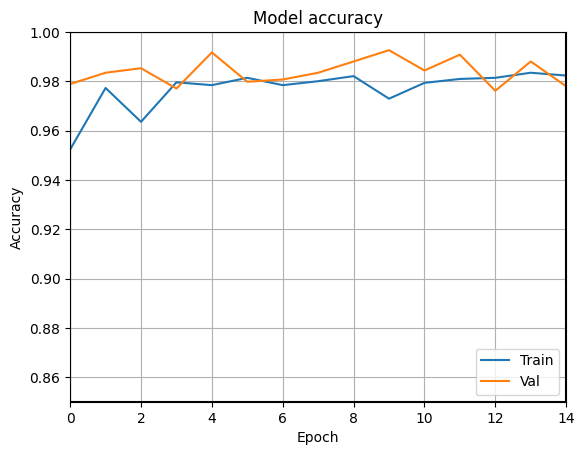

In [ ]:
# Plot training and validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0.85,1])
axes.grid(True, which='both')
axes.axhline(y=0.85, color='k')
axes.axvline(x=0, color='k')
axes.axvline(x=14, color='k')
axes.axhline(y=1, color='k')
plt.legend(['Train','Val'], loc='lower right')
plt.show()

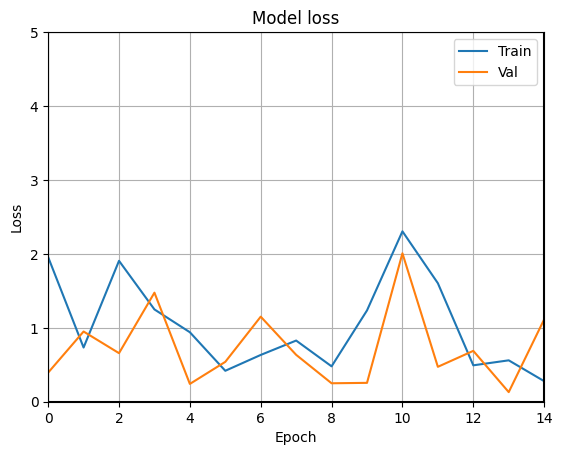

In [ ]:
# Plot training and validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0,5])
axes.grid(True, which='both')
axes.axhline(y=0, color='k')
axes.axvline(x=0, color='k')
axes.axhline(y=5, color='k')
axes.axvline(x=14, color='k')
plt.legend(['Train','Val'], loc='upper right')
plt.show()

In [ ]:
# Write the index of the test sample to test
prediction = model.predict(test_X[136:137])
prediction = prediction[0]
print('Prediction\n',prediction)
print('\nThresholded output\n',(prediction>0.5)*1)

1/1 [==============================] - 0s 75ms/step
Prediction
 [0.9999806]

Thresholded output
 [1]


In [ ]:
print(test_y[136:137])

5389    1.0
Name: isFake, dtype: float64


In [ ]:
# serialize model to JSON
model_json = model.to_json()

# Write the file name of the model

with open("model.json", "w") as json_file:
    json_file.write(model_json)

# serialize weights to HDF5
# Write the file name of the weights

model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


In [ ]:
# load json and create model

# Write the file name of the model

json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# load weights into new model
# Write the file name of the weights

loaded_model.load_weights("model.h5")
print("Loaded model from disk")

Loaded model from disk
